<a href="https://colab.research.google.com/github/Brightson-Abraham/Walmart-Sales-Forecasting-Inventory-Optimization-Using-Time-Series-Analysis/blob/main/Walmart_Sales_Forecasting_Inventory_Optimization_Using_Time_Series_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 6.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX,SARIMAXResults
from sklearn.model_selection import train_test_split


In [ ]:
# Load the dataset
from google.colab import files
uploaded = files.upload()

Saving Walmart.xlsx to Walmart.xlsx


In [ ]:
df = pd.read_excel('/content/Walmart.xlsx')

In [ ]:
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106


In [ ]:
df.tail()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667
6434,45,2012-10-26,760281.43,0,58.85,3.882,192.308899,8.667


In [ ]:
df.shape

(6435, 8)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


In [ ]:
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['Store'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['Weekly_Sales'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['Holiday_Flag'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df, *['Temperature'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['Store'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['Weekly_Sales'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['Holiday_Flag'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df, *['Temperature'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df, *[[['Store', 'Weekly_Sales'], ['Weekly_Sales', 'Holiday_Flag'], ['Holiday_Flag', 'Temperature'], ['Temperature', 'Fuel_Price']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['Date', 'Weekly_Sales', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['Date', 'Holiday_Flag', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['Date', 'Temperature', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df, *['Date', 'Fuel_Price', None], **{})
chart

In [ ]:
df1 = df.copy()
df1['year'] = df1['Date'].dt.year
df1['month'] = df1['Date'].dt.month
df1['week'] = df1['Date'].dt.isocalendar().week.astype(int)
df1.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,5
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,6
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,7
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,8
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,9


In [ ]:
df1.index = df1['Date']
df1.drop(['Date'], axis=1, inplace=True)
df1.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week
Date,,,,,,,,,,
2010-02-05,1,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,5
2010-02-12,1,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,6
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,7
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,8
2010-03-05,1,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,9


In [ ]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [ ]:
df.corr()

<ipython-input-20-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


<ipython-input-21-90ca43bc6cc5>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm',fmt='.2f')


<Axes: >

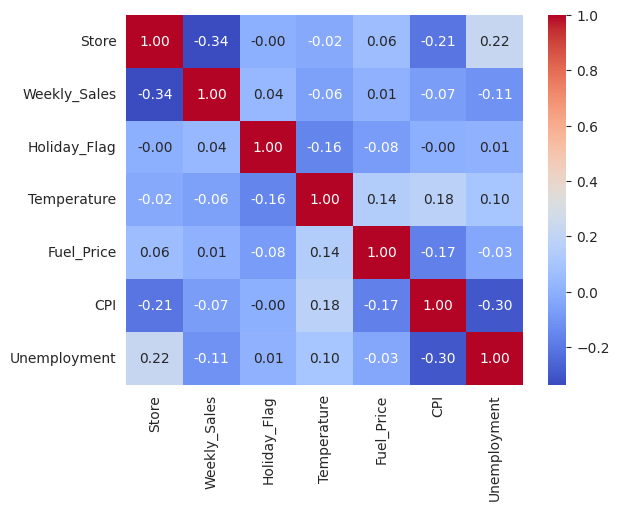

In [ ]:
sns.heatmap(df.corr(), annot=True, cmap='coolwarm',fmt='.2f')

**Exploratory Data Analysis**

**Checking the distribution of data**

In [ ]:
col_list1 = df1.columns
col_list1

Index(['Store', 'Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price',
       'CPI', 'Unemployment', 'year', 'month', 'week'],
      dtype='object')

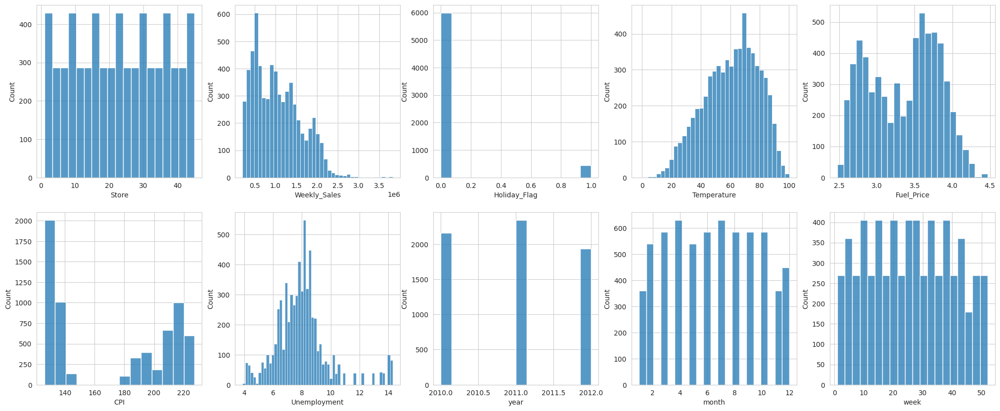

In [ ]:
plt.subplots(2,5, figsize=(25,10))
i = 1
for col in col_list1:
  plt.subplot(2,5,i)
  sns.histplot(df1[col])
  i += 1

**Checking for outliers**

In [ ]:
# Outlier analysis
# Identify outliers using the IQR method for Weekly_Sales
Q1 = df['Weekly_Sales'].quantile(0.25)
Q3 = df['Weekly_Sales'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [ ]:
outliers = data[(data['Weekly_Sales'] < lower_bound) | (data['Weekly_Sales'] > upper_bound)]
outliers

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
189,2,2010-12-24,3436007.68,0,49.97,2.886,211.064660,8.163
241,2,2011-12-23,3224369.80,0,46.66,3.112,218.999550,7.441
471,4,2010-11-26,2789469.45,1,48.08,2.752,126.669267,7.127
474,4,2010-12-17,2740057.14,0,46.57,2.884,126.879484,7.127
475,4,2010-12-24,3526713.39,0,43.21,2.887,126.983581,7.127
523,4,2011-11-25,3004702.33,1,47.96,3.225,129.836400,5.143
526,4,2011-12-16,2771397.17,0,36.44,3.149,129.898065,5.143
527,4,2011-12-23,3676388.98,0,35.92,3.103,129.984548,5.143
761,6,2010-12-24,2727575.18,0,55.07,2.886,212.916508,7.007
1329,10,2010-11-26,2939946.38,1,55.33,3.162,126.669267,9.003


In [ ]:
lower_bound

-746862.7275

In [ ]:
upper_bound

2720371.4924999997

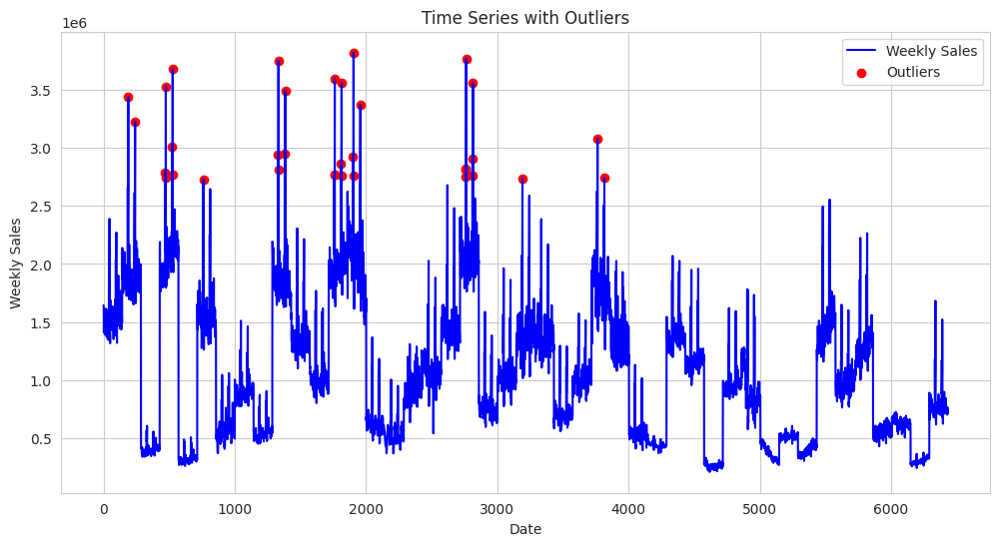

In [ ]:
import matplotlib.pyplot as plt

# Plot the time series data
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Weekly_Sales'], label='Weekly Sales', color='blue')

# Identify and plot the outliers
plt.scatter(outliers.index, outliers['Weekly_Sales'], color='red', label='Outliers')

# Add labels and legend
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Time Series with Outliers')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

From the above visualization we can say outliers are present due to seasonality and not due to any error in data collection.Hence we do not remobe the outliers.

### **Split the dataset based on the Store id.**

In [ ]:
Stores = {}
for i in range(1,46):
  Stores[i] = df1[df1['Store'] == i]

In [ ]:
Stores

{1:             Store  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
 Date                                                                     
 2010-02-05      1    1643690.90             0        42.31       2.572   
 2010-02-12      1    1641957.44             1        38.51       2.548   
 2010-02-19      1    1611968.17             0        39.93       2.514   
 2010-02-26      1    1409727.59             0        46.63       2.561   
 2010-03-05      1    1554806.68             0        46.50       2.625   
 ...           ...           ...           ...          ...         ...   
 2012-09-28      1    1437059.26             0        76.08       3.666   
 2012-10-05      1    1670785.97             0        68.55       3.617   
 2012-10-12      1    1573072.81             0        62.99       3.601   
 2012-10-19      1    1508068.77             0        67.97       3.594   
 2012-10-26      1    1493659.74             0        69.16       3.506   
 
                    

In [ ]:
for i in Stores.keys():
  print(f'Store {i}: {Stores[i].shape}')

Store 1: (143, 10)
Store 2: (143, 10)
Store 3: (143, 10)
Store 4: (143, 10)
Store 5: (143, 10)
Store 6: (143, 10)
Store 7: (143, 10)
Store 8: (143, 10)
Store 9: (143, 10)
Store 10: (143, 10)
Store 11: (143, 10)
Store 12: (143, 10)
Store 13: (143, 10)
Store 14: (143, 10)
Store 15: (143, 10)
Store 16: (143, 10)
Store 17: (143, 10)
Store 18: (143, 10)
Store 19: (143, 10)
Store 20: (143, 10)
Store 21: (143, 10)
Store 22: (143, 10)
Store 23: (143, 10)
Store 24: (143, 10)
Store 25: (143, 10)
Store 26: (143, 10)
Store 27: (143, 10)
Store 28: (143, 10)
Store 29: (143, 10)
Store 30: (143, 10)
Store 31: (143, 10)
Store 32: (143, 10)
Store 33: (143, 10)
Store 34: (143, 10)
Store 35: (143, 10)
Store 36: (143, 10)
Store 37: (143, 10)
Store 38: (143, 10)
Store 39: (143, 10)
Store 40: (143, 10)
Store 41: (143, 10)
Store 42: (143, 10)
Store 43: (143, 10)
Store 44: (143, 10)
Store 45: (143, 10)


The dataset is splitted into 45 parts based on the store number, and each datset have 143
rows and 7 columns

a. If the weekly sales are affected by the unemployment rate, if yes - which
stores are suffering the most?

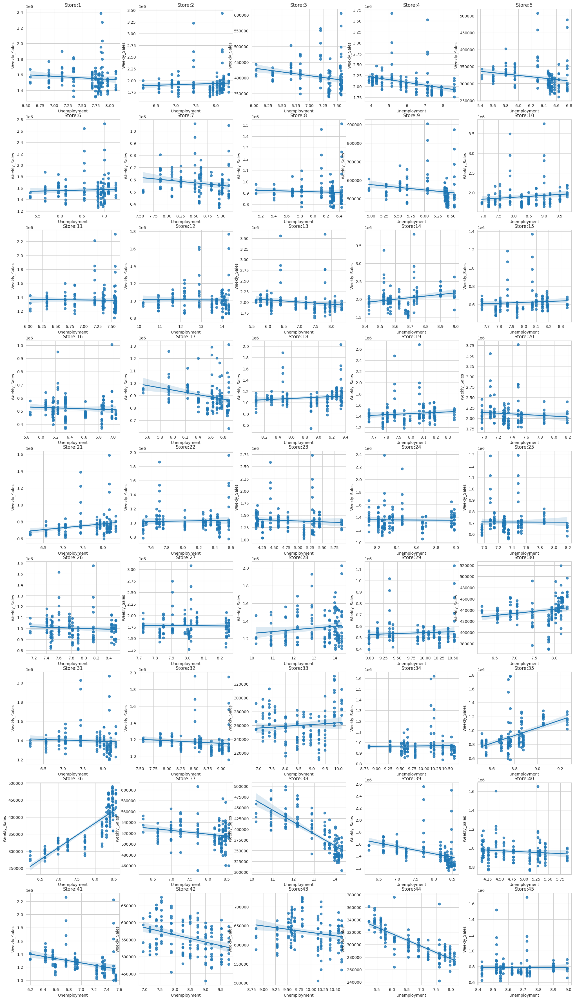

In [ ]:
# Check this with visualization
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
  plt.subplot(9,5,i)
  sns.regplot(x='Unemployment', y='Weekly_Sales', data=Stores[i])
  plt.title(f'Store:{i}')

In [ ]:
import pandas as pd

# Check if weekly sales are affected by unemployment rate
correlation = df['Weekly_Sales'].corr(df['Unemployment'])
print(f"Correlation between Weekly Sales and Unemployment: {correlation}")

# Handle missing values if necessary
df.fillna(0, inplace=True)

# Create an empty dictionary to store correlation results
store_correlations = {}

# Iterate through each store
for store_number in df['Store'].unique():
    # Subset the data for the current store
    store_data = df[df['Store'] == store_number]

    # Calculate the correlation between Weekly Sales and Unemployment Rate for the store
    correlation = store_data['Weekly_Sales'].corr(store_data['Unemployment'])

    # Store the correlation result in the dictionary
    store_correlations[store_number] = correlation

# Find stores with the strongest negative correlation
suffering_stores = [store for store, correlation in store_correlations.items() if correlation < 0]

# Print the stores suffering the most
print("Stores suffering the most (negative correlation with unemployment rate):")
print(suffering_stores)


Correlation between Weekly Sales and Unemployment: -0.10617608965795429
Stores suffering the most (negative correlation with unemployment rate):
[1, 3, 4, 5, 7, 8, 9, 11, 12, 13, 16, 17, 20, 23, 24, 25, 26, 27, 31, 32, 37, 38, 39, 40, 41, 42, 43, 44, 45]


b. If the weekly sales show a seasonal trend, when and what could be the reason?

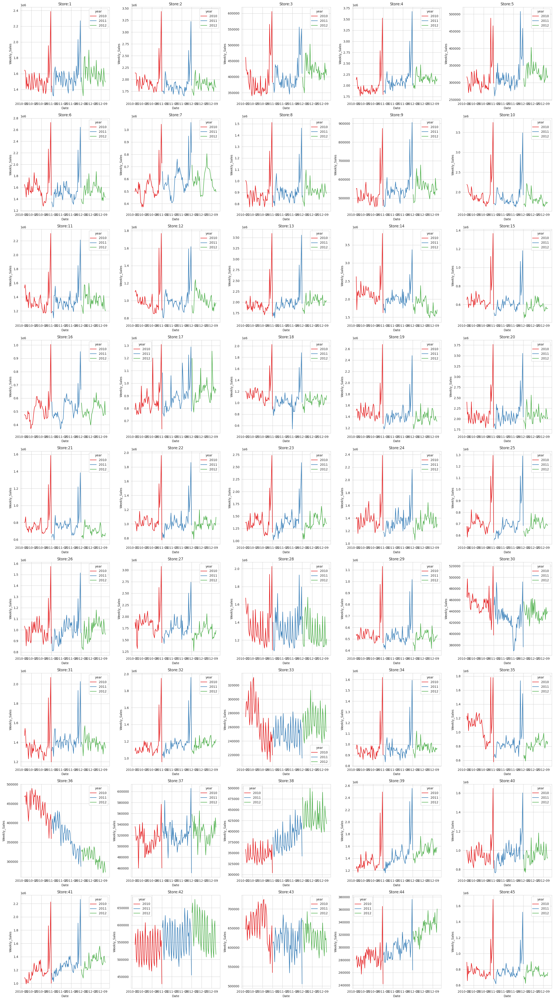

In [ ]:
# Lets visualize the sales of all 45 Stores
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
  plt.subplot(9,5,i)
  sns.lineplot(x='Date', y='Weekly_Sales', data=Stores[i], hue='year',palette='Set1')
  plt.title(f'Store:{i}')

plt.tight_layout()
plt.show()


From the above graph we can see that the weekly sales of each store shows a seasionality at
the end of the year

In [ ]:
df1[df1['Holiday_Flag']==1]['week'].unique()

array([ 6, 36, 47, 52])

In [ ]:
df1[df1['Holiday_Flag']==1]['month'].unique()

array([ 2,  9, 11, 12])

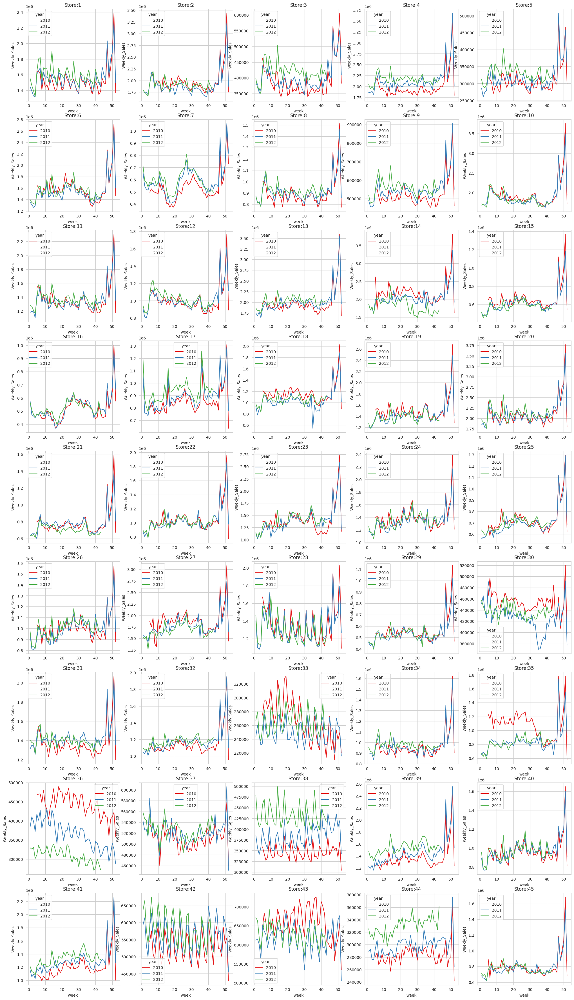

In [ ]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
  plt.subplot(9,5,i)
  sns.lineplot(x='week', y='Weekly_Sales', data=Stores[i], hue='year', palette='Set1')
  plt.title(f'Store:{i}')

<Axes: xlabel='week', ylabel='Weekly_Sales'>

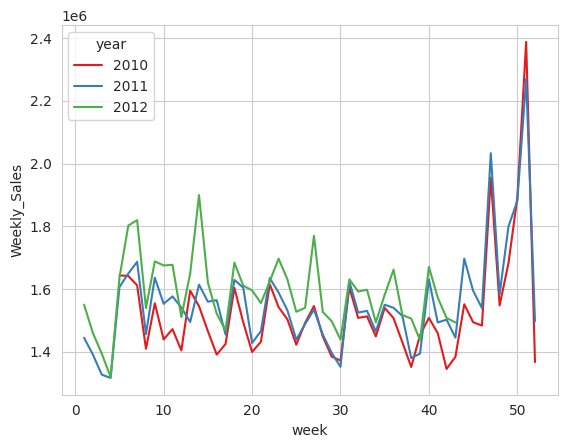

In [ ]:
sns.lineplot(x='week', y='Weekly_Sales', data=Stores[1], hue='year', palette='Set1')

1. From the above graphs we can see that the seasionality of each store occurs in the end of the year.

2. The Festival weeks (Holiday_Flag) are 6, 36, 47, 52 which means there are holidays during these weeks

3. Therefore  the reason for seasionality in the weekly sales of each stores are Holidays (Festivals).

4. The Sales are increased during holidays, hence the seasionality .

c. Does temperature affect the weekly sales in any manner?

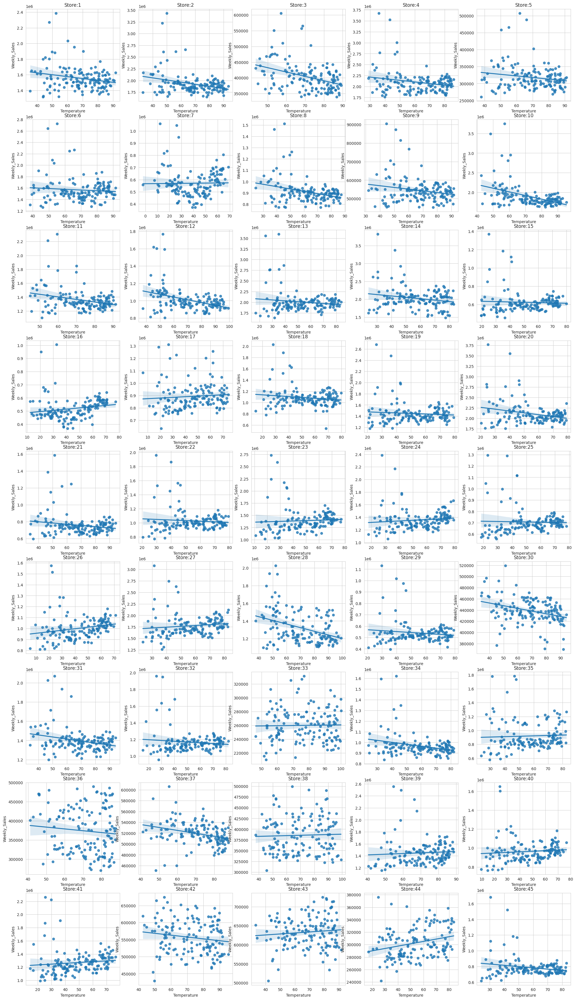

In [ ]:
# Check the relationship by visualization
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
  plt.subplot(9,5,i)
  sns.regplot(x='Temperature', y='Weekly_Sales', data=Stores[i])
  plt.title(f'Store:{i}')

1. From the graph we can see that the weekly sales weakly correlate to temperature.

2. We can confirm this by correlation analysis.

In [ ]:
correlation_temp_sales = df['Weekly_Sales'].corr(df['Temperature'])
print(f"Correlation between Weekly Sales and Temperature: {correlation_temp_sales}")


Correlation between Weekly Sales and Temperature: -0.06381001317946956


Correlation between Weekly Sales and Temperature is weak

e. Top performing stores according to the historical data

In [ ]:
top_stores = df.groupby('Store')['Weekly_Sales'].sum().nlargest(10)
print("Top performing stores:")
print(top_stores)

Top performing stores:
Store
20    3.013978e+08
4     2.995440e+08
14    2.889999e+08
13    2.865177e+08
2     2.753824e+08
10    2.716177e+08
27    2.538559e+08
6     2.237561e+08
1     2.224028e+08
39    2.074455e+08
Name: Weekly_Sales, dtype: float64


f. The worst performing store,
and
how significant is the difference between the highest and lowest performing stores.

In [ ]:
worst_store = df.groupby('Store')['Weekly_Sales'].sum().idxmin()
print(f"Worst performing store: Store {worst_store}")

Worst performing store: Store 33


Calculate the difference between the highest and lowest performing stores

In [ ]:
highest_sales = top_stores.max()
lowest_sales = df.groupby('Store')['Weekly_Sales'].sum().min()
difference = highest_sales - lowest_sales
print(f"Difference between highest and lowest performing stores: {difference}")

Difference between highest and lowest performing stores: 264237570.49999997


2. Use predictive modeling techniques to forecast the sales for each store for the next 12 weeks

Time Series and ForeCasting

Lets take the data of store 1 and perform the time series algorithm

In [ ]:
store = Stores[1]['Weekly_Sales']
store

Date
2010-02-05    1643690.90
2010-02-12    1641957.44
2010-02-19    1611968.17
2010-02-26    1409727.59
2010-03-05    1554806.68
                 ...    
2012-09-28    1437059.26
2012-10-05    1670785.97
2012-10-12    1573072.81
2012-10-19    1508068.77
2012-10-26    1493659.74
Name: Weekly_Sales, Length: 143, dtype: float64

In [ ]:
store.shape

(143,)

<Axes: xlabel='Date'>

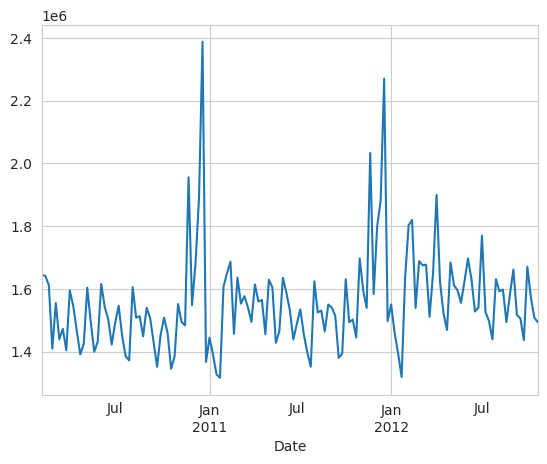

In [ ]:
store.plot()

Check if the data is stationary

In [ ]:
# AD Fuller Test
# p-value>0.05 --> not stationary --> Null Hyp
# p-value<0.05 --> stationary --> Alt Hyp
result = adfuller(store)
p_value = result[1]
print(p_value)
if p_value<0.05:
  print('Stationary')
else:
  print('Not stationary')

1.3877788330759434e-05
Stationary


In [ ]:
# KPSS test( Kwiatkowski–Phillips–Schmidt–Shin test)
stats,p,lags,critical = kpss(store)
if p>0.05:
  print('Stationary')
else:
  print('Not stationary')
print(p)

Not stationary
0.047095888148842614


In [ ]:
rolling_mean = store.rolling(window=52).mean()
rolling_mean

Date
2010-02-05             NaN
2010-02-12             NaN
2010-02-19             NaN
2010-02-26             NaN
2010-03-05             NaN
                  ...     
2012-09-28    1.613969e+06
2012-10-05    1.614734e+06
2012-10-12    1.616264e+06
2012-10-19    1.616370e+06
2012-10-26    1.617300e+06
Name: Weekly_Sales, Length: 143, dtype: float64

In [ ]:
# removing trend from data
rolling_mean_detrended = store-rolling_mean
rolling_mean_detrended

Date
2010-02-05              NaN
2010-02-12              NaN
2010-02-19              NaN
2010-02-26              NaN
2010-03-05              NaN
                  ...      
2012-09-28   -176909.317308
2012-10-05     56052.084615
2012-10-12    -43190.823077
2012-10-19   -108300.747500
2012-10-26   -123640.751538
Name: Weekly_Sales, Length: 143, dtype: float64

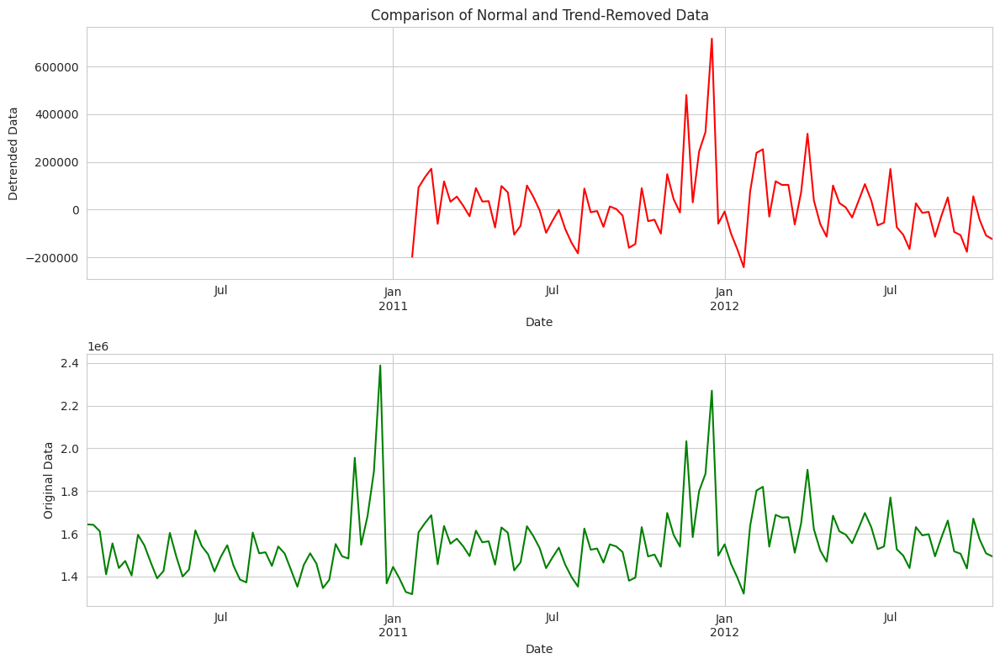

In [ ]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# Plot the trend-removed data on the first subplot
rolling_mean_detrended.plot(color='red', ax=ax1)
ax1.set_ylabel('Detrended Data')
ax1.set_title('Comparison of Normal and Trend-Removed Data')

# Plot the original data on the second subplot
store.plot(color='green', ax=ax2)
ax2.set_ylabel('Original Data')

# Add some spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


We can check the trend and seasonality using the seasonal_decompose() method.

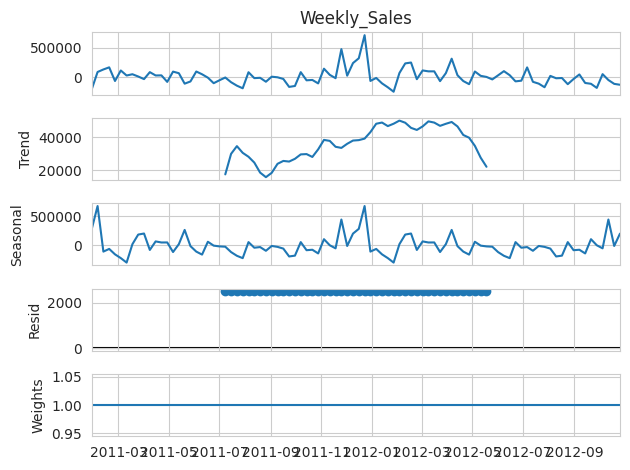

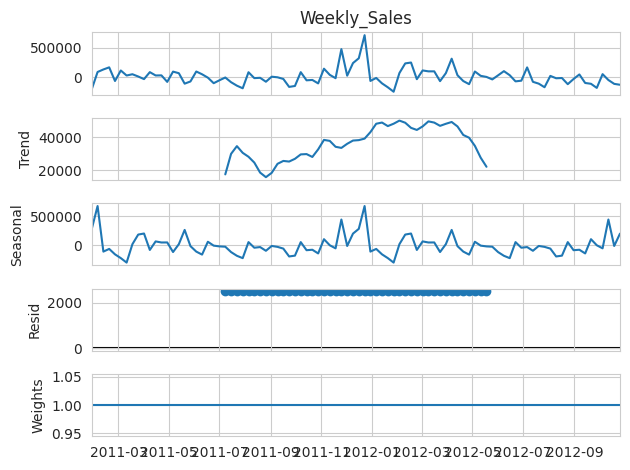

In [ ]:
decompose_result = seasonal_decompose(rolling_mean_detrended.dropna(), period=46)
decompose_result.plot(weights=True)

Removing seasionality

In [ ]:
# Compute the difference between the rolling mean detrended series and a lagged version of itself
rolling_mean_decomposed_diff = rolling_mean_detrended - rolling_mean_detrended.shift()

# Display the resulting series
print(rolling_mean_decomposed_diff)


Date
2010-02-05              NaN
2010-02-12              NaN
2010-02-19              NaN
2010-02-26              NaN
2010-03-05              NaN
                  ...      
2012-09-28    -69884.058269
2012-10-05    232961.401923
2012-10-12    -99242.907692
2012-10-19    -65109.924423
2012-10-26    -15340.004038
Name: Weekly_Sales, Length: 143, dtype: float64


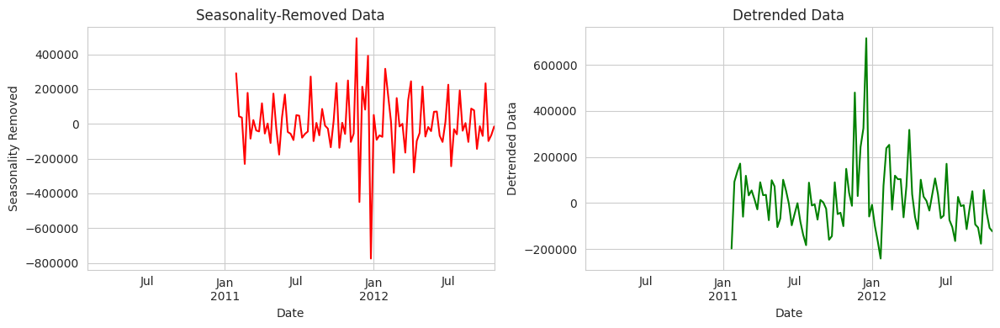

In [ ]:
import matplotlib.pyplot as plt

# Create a figure with two side-by-side subplots
plt.figure(figsize=(12, 4))

# Plot the seasonality-removed data on the first subplot
plt.subplot(121)
rolling_mean_decomposed_diff.plot(color='red')
plt.ylabel('Seasonality Removed')
plt.title('Seasonality-Removed Data')

# Plot the detrended data on the second subplot
plt.subplot(122)
rolling_mean_detrended.plot(color='green')
plt.ylabel('Detrended Data')
plt.title('Detrended Data')

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()


In [ ]:
rolling_mean_decomposed_diff.dropna(inplace=True)
rolling_mean_decomposed_diff

Date
2011-02-04    290442.987692
2011-02-11     42838.090577
2011-02-18     35787.953654
2011-02-25   -230947.744038
2011-03-04    177896.654423
                  ...      
2012-09-28    -69884.058269
2012-10-05    232961.401923
2012-10-12    -99242.907692
2012-10-19    -65109.924423
2012-10-26    -15340.004038
Name: Weekly_Sales, Length: 91, dtype: float64

In [ ]:
final = adfuller(rolling_mean_decomposed_diff)
final[1]

3.257853293563666e-07

In [ ]:
from statsmodels.tsa.stattools import adfuller
#p-value > 0.05: ---> not stationary -> Null Hyp
#p-value <= 0.05: --> stationary-> Alternate Hyp
result = adfuller(rolling_mean_decomposed_diff.dropna())
print(result)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))
if result[1]>0.05:
    print('not stationary')
else:
    print("stationary")

(-5.869955831145223, 3.257853293563666e-07, 7, 83, {'1%': -3.5117123057187376, '5%': -2.8970475206326833, '10%': -2.5857126912469153}, 2075.687144036794)
ADF Statistic: -5.869956
p-value: 0.000000
Critical Values:
	1%: -3.512
	5%: -2.897
	10%: -2.586
stationary


In [ ]:
from statsmodels.tsa.stattools import kpss
stats,p,lags,critical_values=kpss(rolling_mean_decomposed_diff.dropna())
if p>0.05:
  print('stationary')
else:
  print("not stationary")
print(p)

stationary
0.1


<ipython-input-71-355932e8c1f4>:2: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  stats,p,lags,critical_values=kpss(rolling_mean_decomposed_diff.dropna())


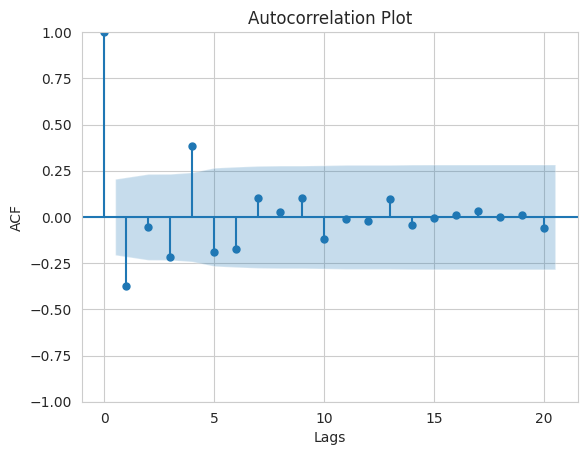

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

# Assuming you have already calculated rolling_mean_decomposed_diff

# Create an ACF plot for a specific number of lags (e.g., 20)
plot_acf(rolling_mean_decomposed_diff, lags=20)

# Set plot title and labels
plt.title('Autocorrelation Plot')
plt.xlabel('Lags')
plt.ylabel('ACF')

# Show the plot
plt.show()


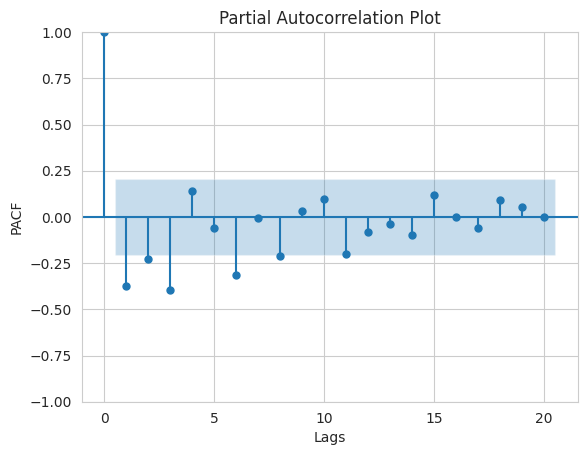

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
import matplotlib.pyplot as plt

# Assuming you have already calculated rolling_mean_decomposed_diff

# Create a PACF plot for a specific number of lags (e.g., 20)
plot_pacf(rolling_mean_decomposed_diff, lags=20)

# Set plot title and labels
plt.title('Partial Autocorrelation Plot')
plt.xlabel('Lags')
plt.ylabel('PACF')

# Show the plot
plt.show()


In [ ]:
# finding the order for ARIMA model
order = auto_arima(rolling_mean_decomposed_diff,trace=True)
order.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2428.230, Time=0.32 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2454.958, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2442.923, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2426.044, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2452.960, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2426.893, Time=0.12 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2426.900, Time=0.11 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2428.257, Time=0.24 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2422.325, Time=0.08 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2421.076, Time=0.14 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2440.908, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.30 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2424.524, Time=0.30 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2423.465, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   91
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -1207.538
Date:                Tue, 10 Oct 2023   AIC                           2421.076
Time:                        17:40:10   BIC                           2428.608
Sample:                    02-04-2011   HQIC                          2424.115
                         - 10-26-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2370      0.116      2.050      0.040       0.010       0.464
ma.L1         -0.9361      0.054    -17.315      0.000      -1.042      -0.830
sigma2      2.002e+10   7.21e-13   2.78e+22      0.000       2e+10       2e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                83.49
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                             1.39
Prob(H) (two-sided):                  0.61   Kurtosis:                         6.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 8.98e+37. Standard errors may be unstable.
"""

In [ ]:
train = rolling_mean_decomposed_diff.iloc[:73]
test = rolling_mean_decomposed_diff.iloc[73:]
# ARIMA ---> AR + MA +I ---> ARIMA--> AR=1 , I=0 , MA=1
model = ARIMA(train, order=(1,0,1))
model_fit = model.fit() # training
model_fit.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           Weekly_Sales   No. Observations:                   73
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -972.872
Date:                Tue, 10 Oct 2023   AIC                           1953.744
Time:                        17:41:44   BIC                           1962.906
Sample:                    02-04-2011   HQIC                          1957.395
                         - 06-22-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1802.9196   1363.342      1.322      0.186    -869.181    4475.021
ar.L1          0.2757      0.095      2.912      0.004       0.090       0.461
ma.L1         -0.9892      0.131     -7.572      0.000      -1.245      -0.733
sigma2      2.317e+10   4.19e-05   5.53e+14      0.000    2.32e+10    2.32e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                55.00
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               1.84   Skew:                             1.34
Prob(H) (two-sided):                  0.14   Kurtosis:                         6.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 4.99e+30. Standard errors may be unstable.
"""

In [ ]:
Predict = model_fit.predict(start= len(train),
end=len(train)+len(test)- 1,
dynamic=True)
Predict

2012-06-29    117101.291295
2012-07-06     33592.102752
2012-07-13     10567.589470
2012-07-20      4219.447173
2012-07-27      2469.186044
2012-08-03      1986.617463
2012-08-10      1853.567353
2012-08-17      1816.883797
2012-08-24      1806.769688
2012-08-31      1803.981104
2012-09-07      1803.212256
2012-09-14      1803.000276
2012-09-21      1802.941830
2012-09-28      1802.925716
2012-10-05      1802.921273
2012-10-12      1802.920048
2012-10-19      1802.919710
2012-10-26      1802.919617
Freq: W-FRI, Name: predicted_mean, dtype: float64

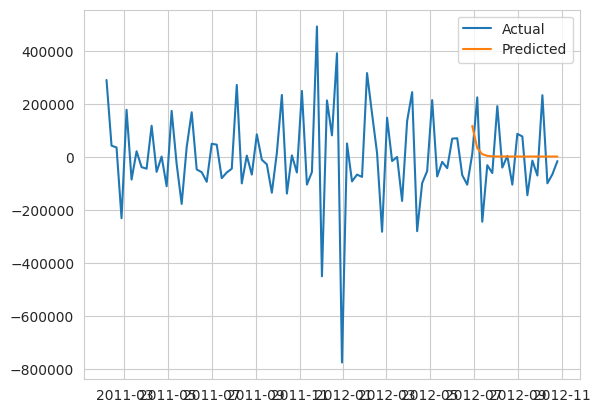

In [ ]:
plt.plot(rolling_mean_decomposed_diff, label='Actual')
plt.plot(Predict, label='Predicted')
plt.legend()

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Define the SARIMAX model with specified orders and seasonal orders
model = SARIMAX(train, order=(1, 0, 1), seasonal_order=(1, 0, 1, 52), enforce_stationarity=False)

# Fit the SARIMAX model to your data
model = model.fit()

# You can now use the fitted model for prediction, forecasting, or further analysis


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:

# Make dynamic predictions
predict = model.predict(start=len(train), end=len(train) + len(test) - 1, dynamic=True)

# Print the predicted values
print(predict)


2012-06-29     34566.747456
2012-07-06     45384.596240
2012-07-13    -76741.304719
2012-07-20    -56119.275537
2012-07-27    -42578.543365
2012-08-03    261353.217736
2012-08-10    -95695.047301
2012-08-17      5096.554800
2012-08-24    -63786.978174
2012-08-31     82068.419350
2012-09-07     -9979.292351
2012-09-14    -26742.332151
2012-09-21   -129581.918597
2012-09-28     15063.036050
2012-10-05    225031.655434
2012-10-12   -132809.900481
2012-10-19      5764.857148
2012-10-26    -56257.069726
Freq: W-FRI, Name: predicted_mean, dtype: float64


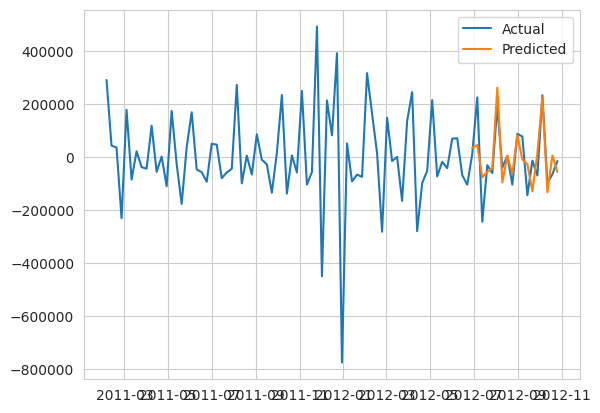

In [ ]:
plt.plot(rolling_mean_decomposed_diff, label='Actual')
plt.plot(predict, label='Predicted')
plt.legend()

From the above graph we can see that the SARIMAX model with seasional order (1,0,1,52) predicted the values perfectly.

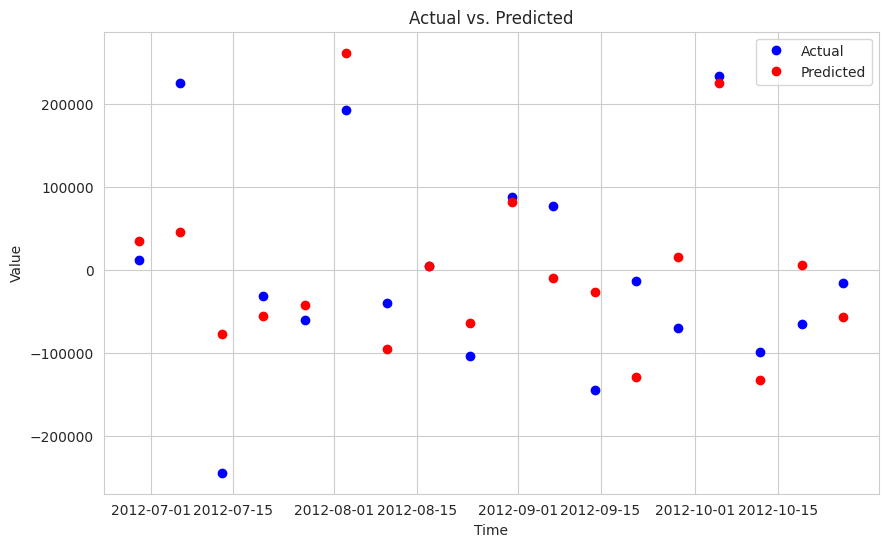

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'test' contains actual values and 'predict' contains predicted values

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the actual values in blue ('bo')
ax.plot(test, 'bo', label='Actual')

# Plot the predicted values in red ('ro')
ax.plot(predict, 'ro', label='Predicted')

# Add labels and a legend
ax.set_xlabel('Time')
ax.set_ylabel('Value')
ax.set_title('Actual vs. Predicted')
ax.legend()

# Show the plot
plt.show()


From the above graph we can see that the predicted data is mostly nearby to the actual data.

In [ ]:
# lets forecast the sales for next 52 weeks
store_1 = Stores[1]['Weekly_Sales']
model=SARIMAX(store_1,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
model = model.fit()
forecast = model.predict(start= len(store_1) ,end=len(store_1)+52, dynamic=True)
forecast

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


2012-11-02    1.702538e+06
2012-11-09    1.609169e+06
2012-11-16    1.557824e+06
2012-11-23    1.994240e+06
2012-11-30    1.590326e+06
2012-12-07    1.774127e+06
2012-12-14    1.850959e+06
2012-12-21    2.202046e+06
2012-12-28    1.490771e+06
2013-01-04    1.535886e+06
2013-01-11    1.453232e+06
2013-01-18    1.391336e+06
2013-01-25    1.324636e+06
2013-02-01    1.611756e+06
2013-02-08    1.749430e+06
2013-02-15    1.762810e+06
2013-02-22    1.510662e+06
2013-03-01    1.643552e+06
2013-03-08    1.623935e+06
2013-03-15    1.624280e+06
2013-03-22    1.480222e+06
2013-03-29    1.590770e+06
2013-04-05    1.803485e+06
2013-04-12    1.564932e+06
2013-04-19    1.479413e+06
2013-04-26    1.426278e+06
2013-05-03    1.615052e+06
2013-05-10    1.549386e+06
2013-05-17    1.522843e+06
2013-05-24    1.489322e+06
2013-05-31    1.555961e+06
2013-06-07    1.611092e+06
2013-06-14    1.549686e+06
2013-06-21    1.455762e+06
2013-06-28    1.467595e+06
2013-07-05    1.659798e+06
2013-07-12    1.450130e+06
2

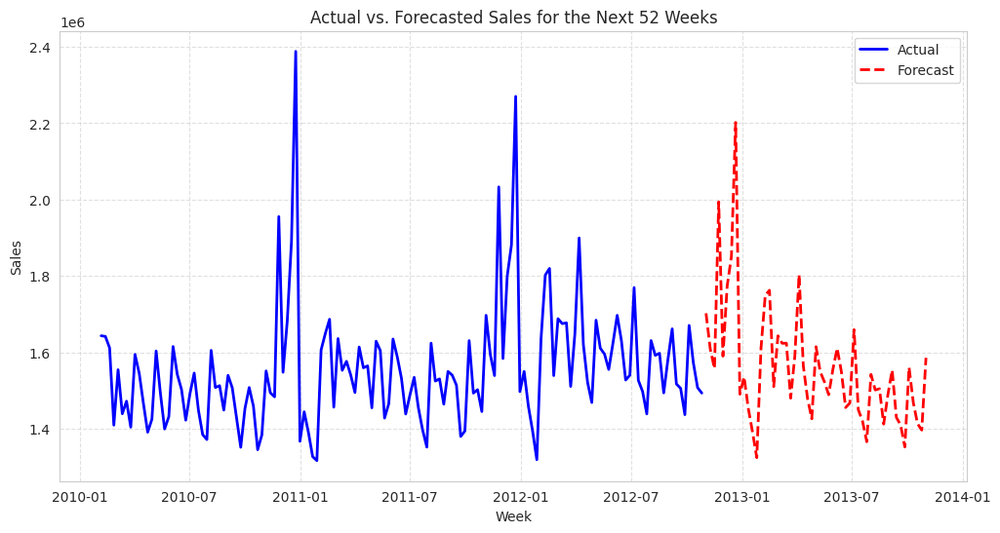

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the actual sales in blue with a solid line
ax.plot(store_1, label='Actual', color='blue', linestyle='-', linewidth=2)

# Plot the forecasted sales in red with a dashed line
ax.plot(forecast, label='Forecast', color='red', linestyle='--', linewidth=2)

# Add labels and a title
ax.set_xlabel('Week')
ax.set_ylabel('Sales')
ax.set_title('Actual vs. Forecasted Sales for the Next 52 Weeks')

# Add a legend
ax.legend()

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.6)

# Show the plot
plt.show()


From the above graph we can see that this SARIMAX model with seasional order of (1,0,1,52) forecated the weekly sales for next 52 weeks perfectly.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning

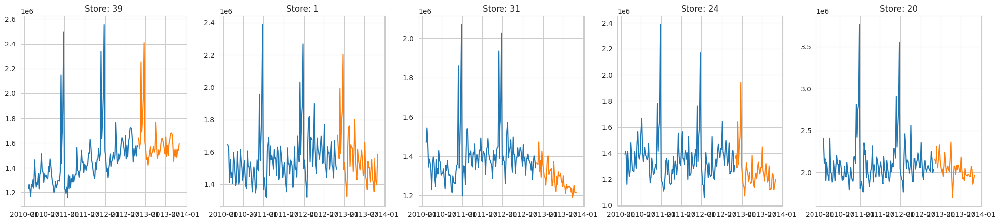

In [ ]:
# Lets check this model for 5 various store
plt.subplots(1,5, figsize=(25,5))
j = 1
for i in np.random.randint(1,45,5):
  store = Stores[i]['Weekly_Sales']
  model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
  model = model.fit()
  forecast = model.predict(start= len(store) ,end=len(store)+52, dynamic=True)
  plt.subplot(1,5,j)
  plt.plot(store, label='Actual')
  plt.plot(forecast, label='Forecast')
  plt.title(f'Store: {i}')
  j += 1

We can see that the SARIMAX model forecasted prefdectly for all stores

In [ ]:
# forecast 12 weeks for each store
predictions = {}
for i in range(1,len(df.Store.unique())+1):
  store = Stores[i]['Weekly_Sales']
  model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
  model=model.fit()
  predict = model.predict(start= len(store) ,end=len(store)+12, dynamic=True)
  predictions[i] = predict

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning

From the above graph we can confirm that the SARIMAX model forecasted perfectly for 37 stores out of 45 stores.